In [41]:
# importing the necessary libraries
from mlxtend.plotting import plot_decision_regions
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV 
from sklearn.metrics import roc_auc_score  
from sklearn.metrics import accuracy_score
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_curve 
from sklearn.metrics import log_loss
import warnings
from time import time
from sklearn import preprocessing
from sklearn.feature_selection import chi2
from sklearn.preprocessing import LabelEncoder 
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report, auc, f1_score, precision_score, recall_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
import pickle
plt.style.use('ggplot')
%matplotlib inline
# Tools & Evaluation metrics
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import roc_curve, accuracy_score, precision_recall_curve 
from sklearn.metrics import f1_score, make_scorer
from sklearn.model_selection import train_test_split, cross_val_score
warnings.filterwarnings('ignore') 

In [3]:
import sys,os
# Block which runs on both Google Colab and Local PC without any modification
if 'google.colab' in sys.modules:    
    project_path = "/content/drive/My Drive/"
    # Google Colab lib
    from google.colab import drive
    # Mount the drive
    drive.mount('/content/drive/', force_remount=True)
    sys.path.append(project_path)
    %cd $project_path

# Let's look at the sys path
print('Current working directory', os.getcwd())

Mounted at /content/drive/
/content/drive/My Drive
Current working directory /content/drive/My Drive


In [4]:
#Loading the dataset
cdi_data = pd.read_csv('/content/drive/My Drive/cdi.csv')

#Print the first 5 rows of the dataframe.
cdi_data.head()

,YearStart,YearEnd,LocationAbbr,LocationDesc,DataSource,Topic,Question,Response,DataValueUnit,DataValueType,...,LocationID,TopicID,QuestionID,DataValueTypeID,StratificationCategoryID1,StratificationID1,StratificationCategoryID2,StratificationID2,StratificationCategoryID3,StratificationID3
0,2010,2010,AK,Alaska,NVSS,Alcohol,Chronic liver disease mortality,NaN,NaN,Number,...,2,ALC,ALC6_0,NMBR,OVERALL,OVR,NaN,NaN,NaN,NaN
1,2017,2017,AK,Alaska,NVSS,Alcohol,Chronic liver disease mortality,NaN,NaN,Number,...,2,ALC,ALC6_0,NMBR,OVERALL,OVR,NaN,NaN,NaN,NaN
2,2018,2018,AK,Alaska,NVSS,Alcohol,Chronic liver disease mortality,NaN,NaN,Number,...,2,ALC,ALC6_0,NMBR,OVERALL,OVR,NaN,NaN,NaN,NaN
3,2011,2011,AK,Alaska,NVSS,Chronic Kidney Disease,Mortality with end-stage renal disease,NaN,NaN,Number,...,2,CKD,CKD1_0,NMBR,RACE,WHT,NaN,NaN,NaN,NaN
4,2012,2012,AK,Alaska,NVSS,Chronic Kidney Disease,Mortality with end-stage renal disease,NaN,NaN,Number,...,2,CKD,CKD1_0,NMBR,RACE,WHT,NaN,NaN,NaN,NaN


In [5]:
print(cdi_data.columns)

Index(['YearStart', 'YearEnd', 'LocationAbbr', 'LocationDesc', 'DataSource',
       'Topic', 'Question', 'Response', 'DataValueUnit', 'DataValueType',
       'DataValue', 'DataValueAlt', 'DataValueFootnoteSymbol',
       'DatavalueFootnote', 'LowConfidenceLimit', 'HighConfidenceLimit',
       'StratificationCategory1', 'Stratification1', 'StratificationCategory2',
       'Stratification2', 'StratificationCategory3', 'Stratification3',
       'GeoLocation', 'ResponseID', 'LocationID', 'TopicID', 'QuestionID',
       'DataValueTypeID', 'StratificationCategoryID1', 'StratificationID1',
       'StratificationCategoryID2', 'StratificationID2',
       'StratificationCategoryID3', 'StratificationID3'],
      dtype='object')


In [6]:
cdi_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1082328 entries, 0 to 1082327
Data columns (total 34 columns):
 #   Column                     Non-Null Count    Dtype  
---  ------                     --------------    -----  
 0   YearStart                  1082328 non-null  int64  
 1   YearEnd                    1082328 non-null  int64  
 2   LocationAbbr               1082328 non-null  object 
 3   LocationDesc               1082328 non-null  object 
 4   DataSource                 1082328 non-null  object 
 5   Topic                      1082328 non-null  object 
 6   Question                   1082328 non-null  object 
 7   Response                   0 non-null        float64
 8   DataValueUnit              942938 non-null   object 
 9   DataValueType              1082328 non-null  object 
 10  DataValue                  729235 non-null   object 
 11  DataValueAlt               727192 non-null   float64
 12  DataValueFootnoteSymbol    366753 non-null   object 
 13  DatavalueFoo

In [7]:
print(cdi_data.shape)
cdi_data.isnull().sum()

(1082328, 34)


YearStart                          0
YearEnd                            0
LocationAbbr                       0
LocationDesc                       0
DataSource                         0
Topic                              0
Question                           0
Response                     1082328
DataValueUnit                 139390
DataValueType                      0
DataValue                     353093
DataValueAlt                  355136
DataValueFootnoteSymbol       715575
DatavalueFootnote             715575
LowConfidenceLimit            465077
HighConfidenceLimit           465077
StratificationCategory1            0
Stratification1                    0
StratificationCategory2      1082328
Stratification2              1082328
StratificationCategory3      1082328
Stratification3              1082328
GeoLocation                     9196
ResponseID                   1082328
LocationID                         0
TopicID                            0
QuestionID                         0
D

In [8]:
cdi_data.describe()

,YearStart,YearEnd,Response,DataValueAlt,LowConfidenceLimit,HighConfidenceLimit,StratificationCategory2,Stratification2,StratificationCategory3,Stratification3,ResponseID,LocationID,StratificationCategoryID2,StratificationID2,StratificationCategoryID3,StratificationID3
count,1.082328e+06,1.082328e+06,0.0,7.271920e+05,617251.000000,617251.000000,0.0,0.0,0.0,0.0,0.0,1.082328e+06,0.0,0.0,0.0,0.0
mean,2.014678e+03,2.015196e+03,NaN,1.028911e+03,51.310313,63.214102,NaN,NaN,NaN,NaN,NaN,3.080346e+01,NaN,NaN,NaN,NaN
std,3.082694e+00,2.738999e+00,NaN,1.927071e+04,88.630405,99.481310,NaN,NaN,NaN,NaN,NaN,1.752053e+01,NaN,NaN,NaN,NaN
min,2.001000e+03,2.001000e+03,NaN,0.000000e+00,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,1.000000e+00,NaN,NaN,NaN,NaN
25%,2.012000e+03,2.013000e+03,NaN,1.720000e+01,11.770000,17.500000,NaN,NaN,NaN,NaN,NaN,1.700000e+01,NaN,NaN,NaN,NaN
50%,2.015000e+03,2.015000e+03,NaN,4.100000e+01,29.200000,42.000000,NaN,NaN,NaN,NaN,NaN,3.000000e+01,NaN,NaN,NaN,NaN
75%,2.017000e+03,2.017000e+03,NaN,7.660000e+01,57.100000,71.735000,NaN,NaN,NaN,NaN,NaN,4.500000e+01,NaN,NaN,NaN,NaN
max,2.021000e+03,2.021000e+03,NaN,2.925456e+06,1615.700000,2137.000000,NaN,NaN,NaN,NaN,NaN,7.800000e+01,NaN,NaN,NaN,NaN


Exploratory Data Analysis (EDA)

In [9]:
def plotPerColumnDistribution(df, nGraphShown, nGraphPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]] # For displaying purposes, pick columns that have between 1 and 50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    nGraphRow = (nCol + nGraphPerRow - 1) / nGraphPerRow
    plt.figure(num = None, figsize = (6 * nGraphPerRow, 8 * nGraphRow), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df.iloc[:, i]
        if (not np.issubdtype(type(columnDf.iloc[0]), np.number)):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{columnNames[i]} (column {i})')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()

In [10]:
def plotCorrelationMatrix(df, graphWidth):
    filename = df.dataframeName
    df = df.dropna('columns') # drop columns with NaN
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    if df.shape[1] < 2:
        print(f'No correlation plots shown: The number of non-NaN or constant columns ({df.shape[1]}) is less than 2')
        return
    corr = df.corr()
    plt.figure(num=None, figsize=(graphWidth, graphWidth), dpi=80, facecolor='w', edgecolor='k')
    corrMat = plt.matshow(corr, fignum = 1)
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
    plt.yticks(range(len(corr.columns)), corr.columns)
    plt.gca().xaxis.tick_bottom()
    plt.colorbar(corrMat)
    plt.title(f'Correlation Matrix for {filename}', fontsize=15)
    plt.show()

In [11]:
# Scatter and density plots
def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df = df.dropna('columns')
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    if len(columnNames) > 10: # reduce the number of columns for matrix inversion of kernel density plots
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()

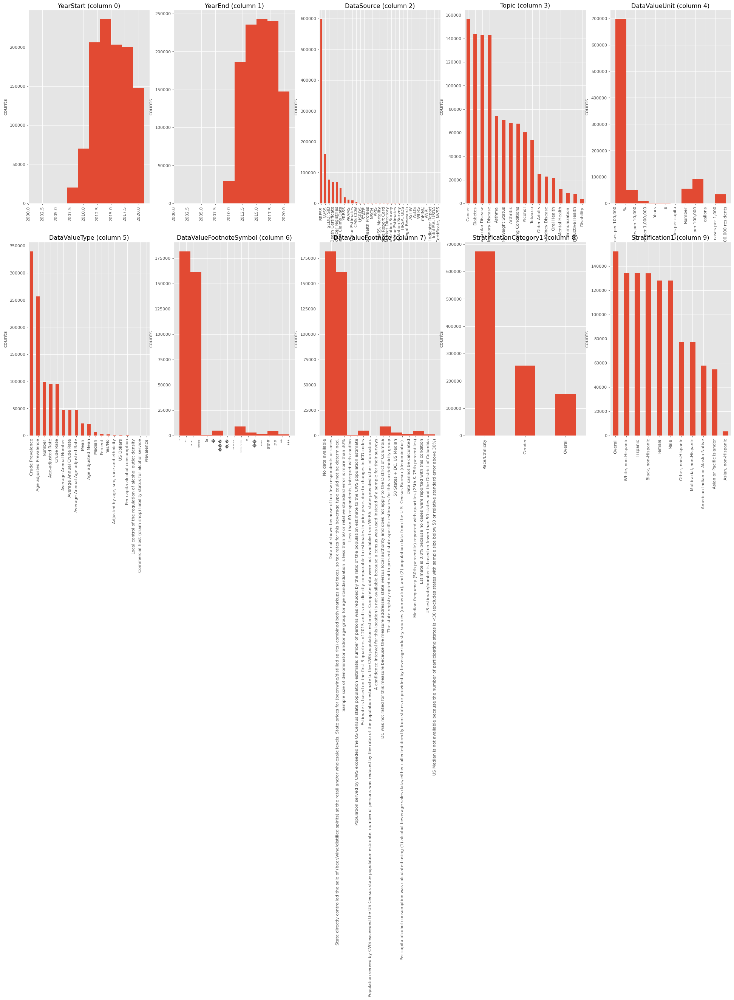

In [12]:
plotPerColumnDistribution(cdi_data, 10, 5)

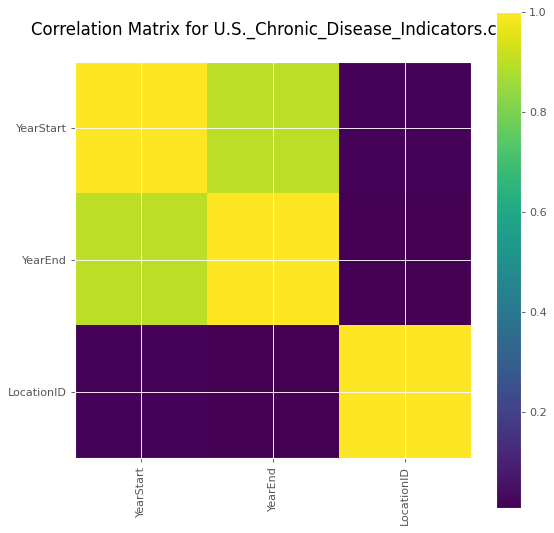

In [13]:
cdi_data.dataframeName = 'U.S._Chronic_Disease_Indicators.csv'
plotCorrelationMatrix(cdi_data, 8)

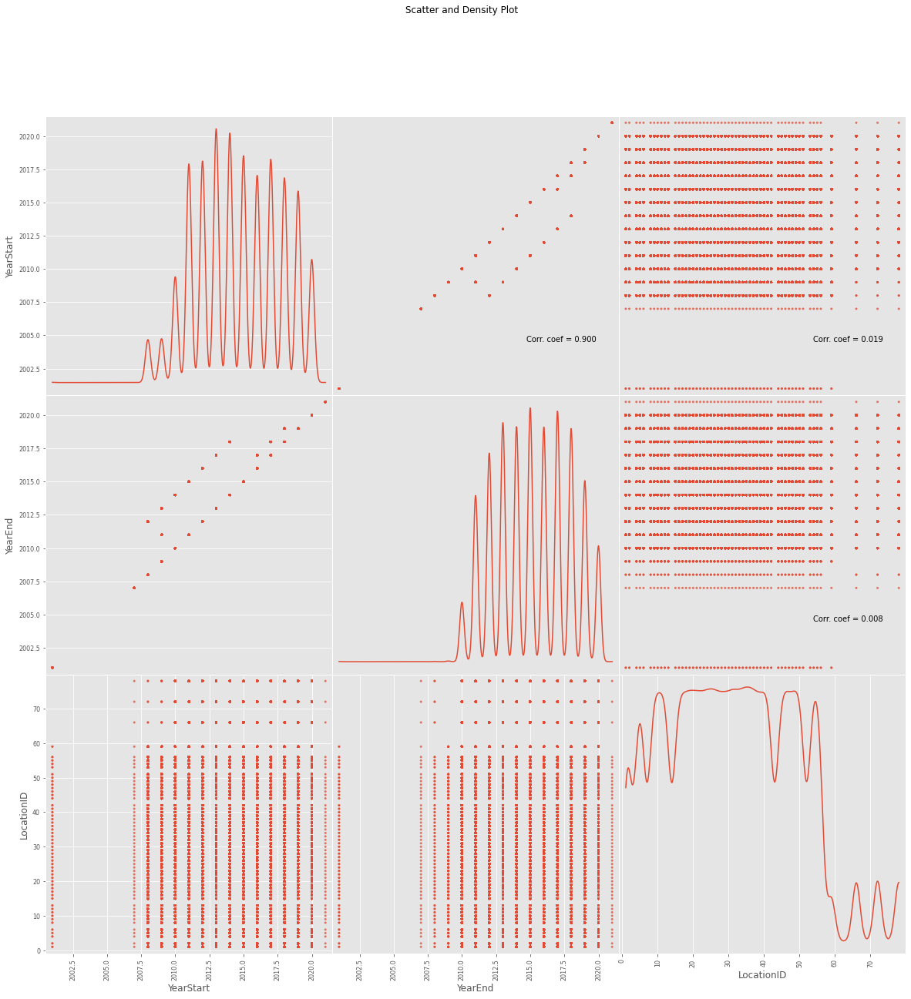

In [14]:
plotScatterMatrix(cdi_data, 20, 10)

In [15]:
# Dropping rows with muissing value in the Data Value column

cdi_data.dropna(subset=['DataValue'])

,YearStart,YearEnd,LocationAbbr,LocationDesc,DataSource,Topic,Question,Response,DataValueUnit,DataValueType,...,LocationID,TopicID,QuestionID,DataValueTypeID,StratificationCategoryID1,StratificationID1,StratificationCategoryID2,StratificationID2,StratificationCategoryID3,StratificationID3
0,2010,2010,AK,Alaska,NVSS,Alcohol,Chronic liver disease mortality,NaN,NaN,Number,...,2,ALC,ALC6_0,NMBR,OVERALL,OVR,NaN,NaN,NaN,NaN
1,2017,2017,AK,Alaska,NVSS,Alcohol,Chronic liver disease mortality,NaN,NaN,Number,...,2,ALC,ALC6_0,NMBR,OVERALL,OVR,NaN,NaN,NaN,NaN
2,2018,2018,AK,Alaska,NVSS,Alcohol,Chronic liver disease mortality,NaN,NaN,Number,...,2,ALC,ALC6_0,NMBR,OVERALL,OVR,NaN,NaN,NaN,NaN
3,2011,2011,AK,Alaska,NVSS,Chronic Kidney Disease,Mortality with end-stage renal disease,NaN,NaN,Number,...,2,CKD,CKD1_0,NMBR,RACE,WHT,NaN,NaN,NaN,NaN
4,2012,2012,AK,Alaska,NVSS,Chronic Kidney Disease,Mortality with end-stage renal disease,NaN,NaN,Number,...,2,CKD,CKD1_0,NMBR,RACE,WHT,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1082322,2020,2020,WA,Washington,BRFSS,Cancer,Papanicolaou smear use among adult women aged ...,NaN,%,Age-adjusted Prevalence,...,53,CAN,CAN2_1,AGEADJPREV,OVERALL,OVR,NaN,NaN,NaN,NaN
1082323,2020,2020,WA,Washington,BRFSS,"Nutrition, Physical Activity, and Weight Status",Obesity among adults aged >= 18 years,NaN,%,Crude Prevalence,...,53,NPAW,NPAW1_1,CRDPREV,RACE,BLK,NaN,NaN,NaN,NaN
1082324,2020,2020,WV,West Virginia,BRFSS,Chronic Obstructive Pulmonary Disease,Prevalence of current smoking among adults >= ...,NaN,%,Age-adjusted Prevalence,...,54,COPD,COPD3_0_1,AGEADJPREV,RACE,WHT,NaN,NaN,NaN,NaN
1082325,2020,2020,WY,Wyoming,BRFSS,Chronic Obstructive Pulmonary Disease,Influenza vaccination among noninstitutionaliz...,NaN,%,Crude Prevalence,...,56,COPD,COPD7_0,CRDPREV,RACE,WHT,NaN,NaN,NaN,NaN


**BUSINESS DECISION 1:**
Which category of disease "Topic" has more questions and thus needs more policy clarification?


Cancer                                             156371
Diabetes                                           143589
Cardiovascular Disease                             143082
Chronic Obstructive Pulmonary Disease              142704
Asthma                                              74440
Nutrition, Physical Activity, and Weight Status     70743
Arthritis                                           67860
Overarching Conditions                              67591
Alcohol                                             60161
Tobacco                                             53932
Older Adults                                        25068
Chronic Kidney Disease                              22634
Oral Health                                         21477
Mental Health                                       12005
Immunization                                         8700
Reproductive Health                                  8049
Disability                                           3922
Name: Topic, d

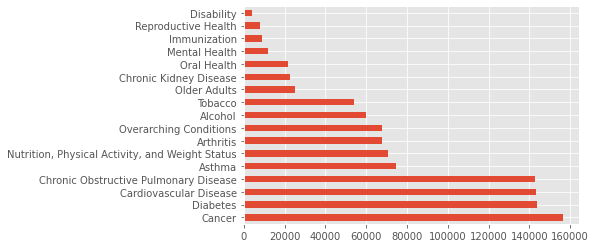

In [16]:
CountStatus=cdi_data['Topic'].value_counts()
print (CountStatus)
CountStatus.plot.barh()

**BUSINESS DECISION 2:** Which questions pertain to the insurance policy amount and need to be revisited with respect to policy designing?

In [17]:
df_exp= cdi_data[cdi_data['DataValueUnit']=='$']
df_exp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 810 entries, 52 to 489354
Data columns (total 34 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   YearStart                  810 non-null    int64  
 1   YearEnd                    810 non-null    int64  
 2   LocationAbbr               810 non-null    object 
 3   LocationDesc               810 non-null    object 
 4   DataSource                 810 non-null    object 
 5   Topic                      810 non-null    object 
 6   Question                   810 non-null    object 
 7   Response                   0 non-null      float64
 8   DataValueUnit              810 non-null    object 
 9   DataValueType              810 non-null    object 
 10  DataValue                  615 non-null    object 
 11  DataValueAlt               615 non-null    float64
 12  DataValueFootnoteSymbol    195 non-null    object 
 13  DatavalueFootnote          195 non-null    obj

Filtering data to consider only United States locations

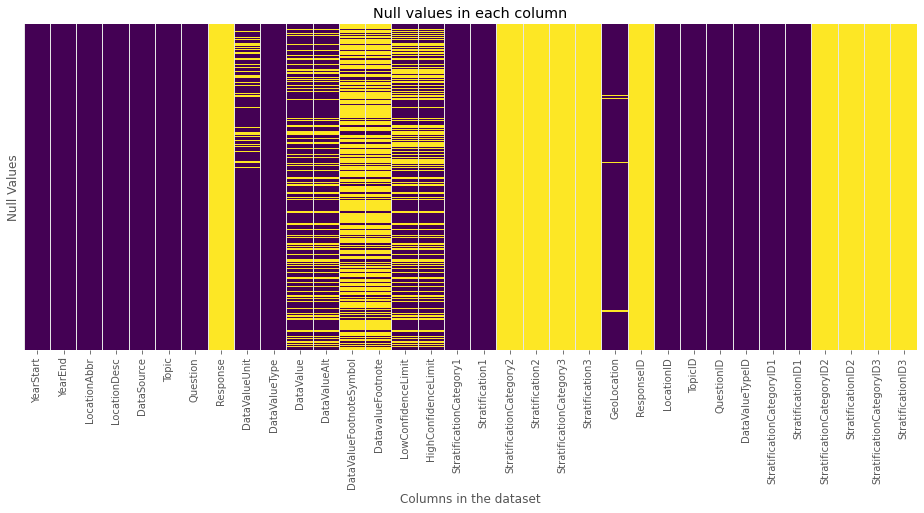

In [18]:
df=cdi_data
plt.figure(figsize=(16,6))
ax = sns.heatmap(df.isnull(),yticklabels = False, cbar = False, cmap='viridis')
ax.set(xlabel = 'Columns in the dataset', ylabel = 'Null Values', title = 'Null values in each column') 

df = df.drop(['YearEnd','DataSource','LowConfidenceLimit','HighConfidenceLimit','LocationID',
              'DataValueFootnoteSymbol','DatavalueFootnote','Response','ResponseID', 'StratificationCategory2',
              'StratificationCategory3','Stratification2','Stratification3', 'StratificationCategoryID2', 
              'StratificationCategoryID3','StratificationID2','StratificationID3'], axis = 1)

df['YearStart'] = pd.to_numeric(df['YearStart'])
df = df[(df['YearStart'] > 2009) & (df['YearStart'] < 2016)]

df['GeoLocation'] = df['GeoLocation'].str.replace(r"\(","")
df['GeoLocation'] = df['GeoLocation'].str.replace(r"\)","")
new = df['GeoLocation'].str.split(" ", n = 2, expand = True)
df["Latitude"] = new[2]
df["Longitude"] = new[1]
df.drop(columns=["GeoLocation"], inplace = True)
df.drop(df[df.LocationDesc == 'United States'].index,
            inplace = True)

df = df.dropna()


In [19]:
df_new=df
print(df_new.groupby('YearStart')['Topic'].count())
df_new.groupby(['Topic','YearStart'])['YearStart'].count()
df_new.groupby(['Topic','Question']).agg({'Question':'count'})
df[df['Topic']=='Alcohol'].groupby(['Topic','Question']).agg({'Question':'count'})
df_new.groupby(df_new['Topic']=='Alcohol')['Question'].apply(lambda x: list(np.unique(x))).count()
df_new.groupby('Topic')['Question'].nunique()
df.groupby(['Topic','Question']).nunique()
print(df[df['Topic']=='Diabetes'].groupby(['Topic','Question']).agg({'Question':'count'}))
print(df[df['Topic']=='Cardiovascular Disease'].groupby(['Topic','Question']).agg({'Question':'count'}))
print(df[df['Topic']=='Chronic Obstructive Pulmonary Disease'].groupby(['Topic','Question']).agg({'Question':'count'}))
#df_g2.head()
print(df.info())

YearStart
2010    24295
2011    58854
2012    60959
2013    69937
2014    64400
2015    59838
Name: Topic, dtype: int64
                                                             Question
Topic    Question                                                    
Diabetes Adults with diagnosed diabetes aged >= 18 years...      1867
         Amputation of a lower extremity attributable to...      1152
         Diabetes prevalence among women aged 18-44 years         656
         Dilated eye examination among adults aged >= 18...      1864
         Foot examination among adults aged >= 18 years ...      1859
         Glycosylated hemoglobin measurement among adult...      1838
         Hospitalization with diabetes as a listed diagn...      1492
         Influenza vaccination among noninstitutionalize...      2562
         Influenza vaccination among noninstitutionalize...      2434
         Mortality due to diabetes reported as any liste...      3994
         Mortality with diabetic ketoaci

[Text(0, 0.5, 'Type of disease'),
 Text(0.5, 0, 'Count'),
 Text(0.5, 1.0, 'Distribution of data by topic')]

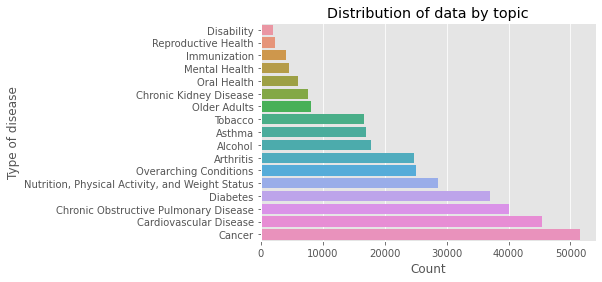

In [20]:

df_by_topic = df_new.groupby('Topic')
#type(df_by_topic)
df_by_topic.describe().head()
df_by_topic_count = df_by_topic.count()
#df_by_topic_count.head()
df_by_topic_count.rename(columns={'YearStart':'count'}, inplace = True)
#print(df_by_topic_count.columns)
df_by_topic_count.sort_values(by=['count'], inplace=True)
#print(df_by_topic_count)
#plt.scatter(df_by_count.index, df_by_count)
sns.set_palette('Set3',6)
ax = sns.barplot(df_by_topic_count['count'], df_by_topic_count.index)
ax.set(xlabel = 'Count', ylabel = 'Type of disease', title = 'Distribution of data by topic')


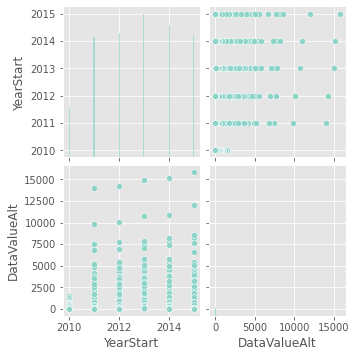

In [21]:
p=sns.pairplot(df)

In [22]:
q3 = df.quantile(0.75)
q1 = df.quantile(0.25)
iqr = q3 - q1
print('IQR for data attributes')
print(iqr)

IQR for data attributes
YearStart        2.0
DataValueAlt    51.0
dtype: float64


In [23]:
data_out = df[~((df < (q1 - 1.5 * iqr)) |(df> (q3 + 1.5 * iqr))).any(axis=1)]
print('{} points are outliers based on IQR'.format(df.shape[0] - data_out.shape[0]))

25842 points are outliers based on IQR


In [24]:
print(df.columns)
for col in df:
  print(df[col].unique())

Index(['YearStart', 'LocationAbbr', 'LocationDesc', 'Topic', 'Question',
       'DataValueUnit', 'DataValueType', 'DataValue', 'DataValueAlt',
       'StratificationCategory1', 'Stratification1', 'TopicID', 'QuestionID',
       'DataValueTypeID', 'StratificationCategoryID1', 'StratificationID1',
       'Latitude', 'Longitude'],
      dtype='object')
[2010 2011 2015 2013 2012 2014]
['AK' 'AL' 'AZ' 'CO' 'CT' 'DE' 'HI' 'IA' 'IL' 'KS' 'LA' 'MD' 'ME' 'MI'
 'MO' 'MS' 'MT' 'NC' 'NH' 'NJ' 'NM' 'NV' 'RI' 'TX' 'WA' 'CA' 'AR' 'DC'
 'FL' 'IN' 'MA' 'KY' 'GA' 'GU' 'ID' 'NE' 'MN' 'NY' 'OR' 'OH' 'OK' 'SC'
 'TN' 'UT' 'PA' 'VA' 'VT' 'WI' 'WV' 'ND' 'WY' 'SD' 'PR' 'VI']
['Alaska' 'Alabama' 'Arizona' 'Colorado' 'Connecticut' 'Delaware' 'Hawaii'
 'Iowa' 'Illinois' 'Kansas' 'Louisiana' 'Maryland' 'Maine' 'Michigan'
 'Missouri' 'Mississippi' 'Montana' 'North Carolina' 'New Hampshire'
 'New Jersey' 'New Mexico' 'Nevada' 'Rhode Island' 'Texas' 'Washington'
 'California' 'Arkansas' 'District of Columbia' 'Florid

In [25]:

# Import label encoder
from sklearn import preprocessing
  
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
  
# Encode labels in column 'species'.
df['LocationAbbr']= label_encoder.fit_transform(df['LocationAbbr'])
df['LocationDesc']= label_encoder.fit_transform(df['LocationDesc'])
df['Question']= label_encoder.fit_transform(df['Question'])
df['DataValueUnit']= label_encoder.fit_transform(df['DataValueUnit'])
df['StratificationCategory1']= label_encoder.fit_transform(df['StratificationCategory1'])
df['Stratification1']= label_encoder.fit_transform(df['Stratification1'])
df['TopicID']= label_encoder.fit_transform(df['TopicID'])
df['QuestionID']= label_encoder.fit_transform(df['QuestionID'])
df['DataValueTypeID']= label_encoder.fit_transform(df['DataValueTypeID'])
df['StratificationCategoryID1']= label_encoder.fit_transform(df['StratificationCategoryID1'])
df['StratificationID1']= label_encoder.fit_transform(df['StratificationID1'])
df['Latitude']= label_encoder.fit_transform(df['Latitude'])
df['DataValueType']= label_encoder.fit_transform(df['DataValueType'])


In [26]:
df.head()

,YearStart,LocationAbbr,LocationDesc,Topic,Question,DataValueUnit,DataValueType,DataValue,DataValueAlt,StratificationCategory1,Stratification1,TopicID,QuestionID,DataValueTypeID,StratificationCategoryID1,StratificationID1,Latitude,Longitude
11,2010,0,1,Cardiovascular Disease,110,6,7,41.3,41.3,1,9,6,78,7,1,11,53,-147.72205903599973
16,2011,1,0,Disability,47,1,6,42.0,42.0,0,6,8,110,6,0,7,9,-86.63186076199969
18,2010,1,0,Diabetes,155,1,13,4.5,4.5,1,9,7,103,13,1,11,9,-86.63186076199969
52,2015,3,2,Alcohol,7,0,14,3.00,3.0,1,9,0,13,14,1,11,13,-111.76381127699972
76,2010,5,5,Overarching Conditions,141,1,6,14,14.0,0,4,14,161,6,0,6,23,-106.13361092099967


**Test Train Split and Cross Validation methods**
Train Test Split : To have unknown datapoints to test the data rather than testing with the same points with which the model was trained. This helps capture the model performance much better.



Cross Validation: When model is split into training and testing it can be possible that specific type of data point may go entirely into either training or testing portion. This would lead the model to perform poorly. Hence over-fitting and underfitting problems can be well avoided with cross validation techniques



In [27]:
X =  pd.DataFrame(df.drop(["Topic"],axis = 1))
y = df.Topic

In [28]:
#importing train_test_split
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.4,random_state=42, stratify=y)

In [29]:
from sklearn.naive_bayes import GaussianNB 

In [30]:
#Create a dataframe to capture the accuracy and f1-score of various models   
log_cols=["Classifier", "Precision", "Recall", "Accuracy", "f1_score", "Latency"]
log = pd.DataFrame(columns=log_cols)

from sklearn.model_selection import cross_val_score

In [31]:
# Create a function for various classification models
# A class that logs the time
class Timer():
    '''
    A generic class to log the time
    '''
    def __init__(self):
        self.start_ts = None
    def start(self):
        self.start_ts = time()
    def stop(self):
        return 'Time taken: %2fs' % (time()-self.start_ts)
    
timer = Timer()

# A method that plots the Precision-Recall curve
def plot_prec_recall_vs_thresh(precisions, recalls, thresholds):
    plt.figure(figsize=(10,5))
    plt.plot(thresholds, precisions[:-1], 'b--', label='precision')
    plt.plot(thresholds, recalls[:-1], 'g--', label = 'recall')
    plt.xlabel('Threshold')
    plt.legend()


# A method to train and test the model
def run_classification(estimator, X_train, X_test, y_train, y_test, clfname, arch_name=None, pipelineRequired=False, isDeepModel=False):
    global log
    timer.start()
    # train the model
    clf = estimator
    modelname = clfname
    scores = cross_val_score(clf, X_train, y_train, cv=10) 

    if pipelineRequired :
        clf = Pipeline([('vect', CountVectorizer()),
                     ('tfidf', TfidfTransformer()),
                     ('clf', estimator),
                     ])
      
    if isDeepModel :
      
        clf.fit(X_train, y_train, validation_data=(X_test, y_test),epochs=10, batch_size=128,verbose=1,callbacks=call_backs(arch_name))
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_pred = np.argmax(y_pred, axis=1)
        y_train_pred = clf.predict(X_train)
        y_train_pred = np.argmax(y_train_pred, axis=1)
    else :
        clf.fit(X_train, y_train)
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_train_pred = clf.predict(X_train)
    
    print('Estimator:', clf)
    print('='*80)
    print('Training accuracy: %.2f%%' % (accuracy_score(y_train,y_train_pred) * 100))
    print('Testing accuracy: %.2f%%' % (accuracy_score(y_test, y_pred) * 100))
    print('='*80)

    try:
      classes = y_train.unique().tolist()
    except:
      classes = np.unique(y_train).tolist()
    print('Confusion matrix:\n')
    hmap = sns.heatmap(pd.DataFrame(confusion_matrix(y_test, y_pred), index=classes, columns=classes), annot=True, fmt="d")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    print('='*80)
    print('Classification report:\n %s' % (classification_report(y_test, y_pred)))

    print(timer.stop(), 'to run the model')
    time_taken=timer.stop()
    log_entry = pd.DataFrame([[modelname,precision_score(y_pred, y_test,average='weighted'),recall_score(y_pred, y_test,average='weighted'),
                               accuracy_score(y_pred, y_test),f1_score(y_pred, y_test,average='weighted'),time_taken]], columns=log_cols)
    log = log.append(log_entry)

Estimator: GaussianNB()
Training accuracy: 100.00%
Testing accuracy: 100.00%
Confusion matrix:

Classification report:
                                                  precision    recall  f1-score   support

                                        Alcohol       1.00      1.00      1.00      7146
                                      Arthritis       1.00      1.00      1.00      9904
                                         Asthma       1.00      1.00      1.00      6786
                                         Cancer       1.00      1.00      1.00     20596
                         Cardiovascular Disease       1.00      1.00      1.00     18161
                         Chronic Kidney Disease       1.00      1.00      1.00      3039
          Chronic Obstructive Pulmonary Disease       1.00      1.00      1.00     16048
                                       Diabetes       1.00      1.00      1.00     14800
                                     Disability       1.00      1.00      1.00

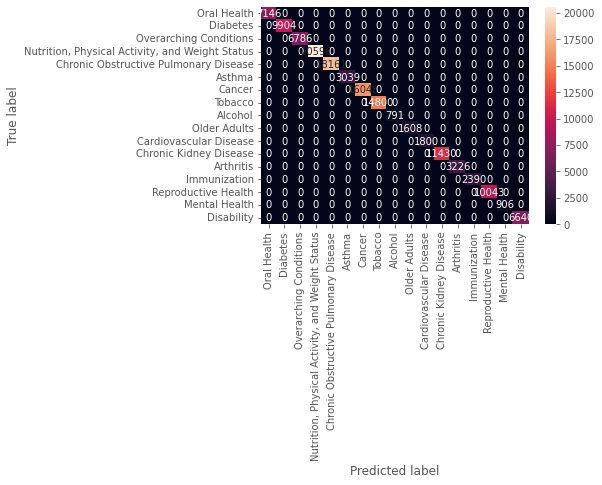

In [32]:
run_classification(GaussianNB(), X_train, X_test, y_train, y_test,"GaussianNB-BOW & Hierarchical")

Estimator: LogisticRegression(C=100000.0, class_weight='balanced', n_jobs=1)
Training accuracy: 51.27%
Testing accuracy: 51.48%
Confusion matrix:

Classification report:
                                                  precision    recall  f1-score   support

                                        Alcohol       0.50      0.78      0.61      7146
                                      Arthritis       0.71      0.53      0.61      9904
                                         Asthma       0.27      0.37      0.31      6786
                                         Cancer       0.72      0.56      0.63     20596
                         Cardiovascular Disease       0.58      0.51      0.54     18161
                         Chronic Kidney Disease       0.05      0.16      0.07      3039
          Chronic Obstructive Pulmonary Disease       0.42      0.28      0.33     16048
                                       Diabetes       0.64      0.41      0.50     14800
                           

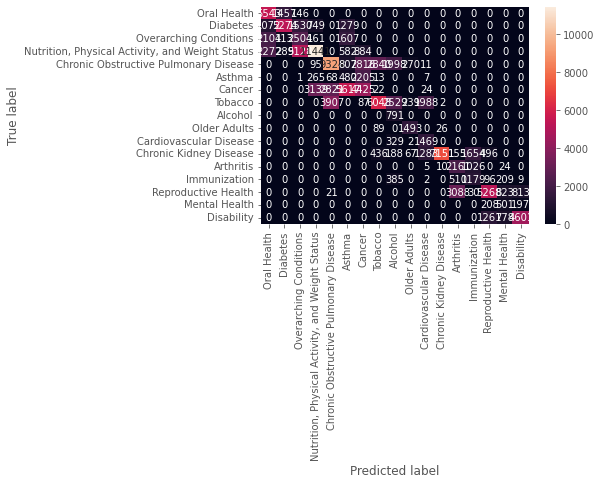

In [33]:
run_classification(LogisticRegression(n_jobs=1, C=1e5,class_weight='balanced'), X_train, X_test, y_train, y_test, "LogisticRegression-BOW & Hierarchical")

Estimator: RandomForestClassifier(class_weight='balanced', max_depth=15, random_state=0)
Training accuracy: 100.00%
Testing accuracy: 100.00%
Confusion matrix:

Classification report:
                                                  precision    recall  f1-score   support

                                        Alcohol       1.00      1.00      1.00      7146
                                      Arthritis       1.00      1.00      1.00      9904
                                         Asthma       1.00      1.00      1.00      6786
                                         Cancer       1.00      1.00      1.00     20596
                         Cardiovascular Disease       1.00      1.00      1.00     18161
                         Chronic Kidney Disease       1.00      1.00      1.00      3039
          Chronic Obstructive Pulmonary Disease       1.00      1.00      1.00     16048
                                       Diabetes       1.00      1.00      1.00     14800
             

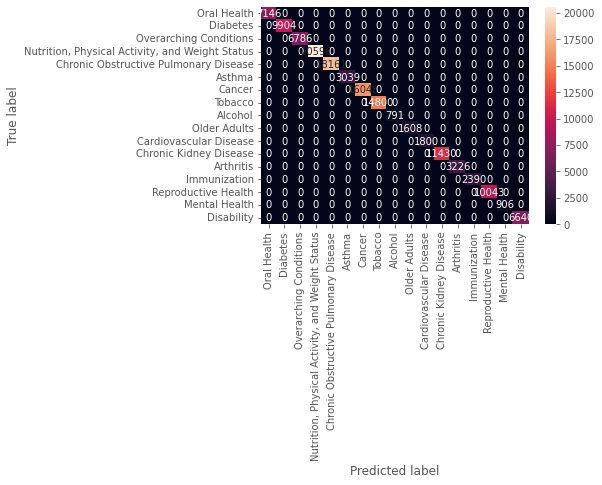

In [34]:
run_classification(RandomForestClassifier(max_depth=15, random_state=0, class_weight="balanced"), X_train, X_test, y_train, y_test, "RandomForest-BOW &Hierarchical") 

Estimator: DecisionTreeClassifier()
Training accuracy: 100.00%
Testing accuracy: 100.00%
Confusion matrix:

Classification report:
                                                  precision    recall  f1-score   support

                                        Alcohol       1.00      1.00      1.00      7146
                                      Arthritis       1.00      1.00      1.00      9904
                                         Asthma       1.00      1.00      1.00      6786
                                         Cancer       1.00      1.00      1.00     20596
                         Cardiovascular Disease       1.00      1.00      1.00     18161
                         Chronic Kidney Disease       1.00      1.00      1.00      3039
          Chronic Obstructive Pulmonary Disease       1.00      1.00      1.00     16048
                                       Diabetes       1.00      1.00      1.00     14800
                                     Disability       1.00      1.

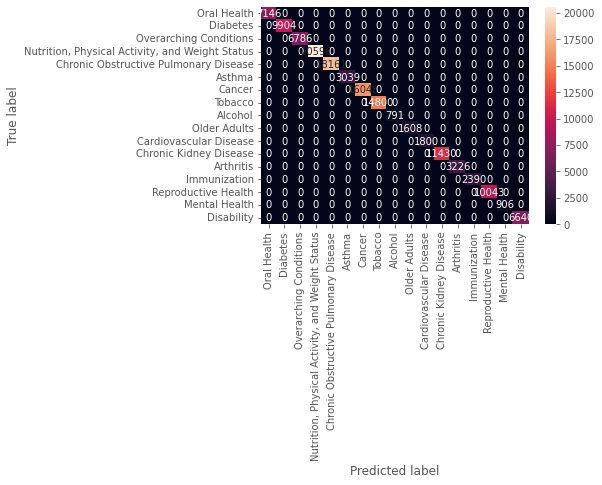

In [35]:
run_classification(DecisionTreeClassifier(), X_train, X_test, y_train, y_test, "DecisionTree-BOW & Hierarchical")

In [36]:
log.set_index(["Classifier"]).sort_values(by=['f1_score'])

,Precision,Recall,Accuracy,f1_score,Latency
Classifier,,,,,
LogisticRegression-BOW & Hierarchical,0.53829,0.514751,0.514751,0.489124,Time taken: 411.962126s
GaussianNB-BOW & Hierarchical,1.00000,1.000000,1.000000,1.000000,Time taken: 22.358898s
RandomForest-BOW &Hierarchical,1.00000,1.000000,1.000000,1.000000,Time taken: 288.043529s
DecisionTree-BOW & Hierarchical,1.00000,1.000000,1.000000,1.000000,Time taken: 25.653130s


In [37]:
#pd.set_option('display.max_colwidth', None)
import matplotlib.pyplot as plt 
from matplotlib.ticker import MaxNLocator
import seaborn as sns
sns.set(style='whitegrid',palette='muted',font_scale=1.2)
HAPPY_COLORS_PALETTE = ["#01BEFE","#FFDD00","#FF7D00","#FF006D","#ADFF02","#8F00FF"]
sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

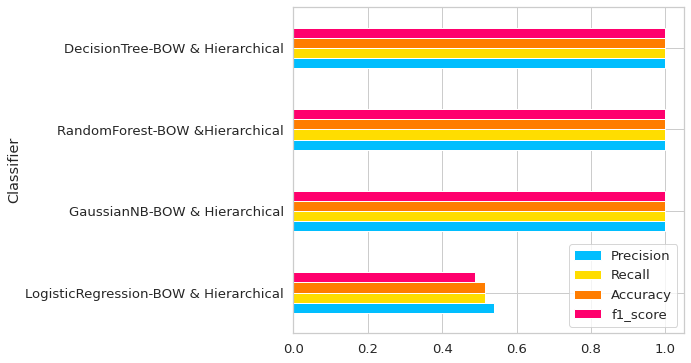

In [38]:
log.set_index(["Classifier"]).sort_values(by=['f1_score']).plot(kind='barh',figsize=[7,6])

In [39]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
print(metrics.accuracy_score(y_test, y_pred))

0.988338235511477


In [44]:
import plotly.express as px
import pandas as pd

fig = px.scatter_geo(df,lat='Latitude',lon='Longitude', hover_name="Topic")
#fig.update_layout(title = 'World map', title_x=0.5)
fig.show()